In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px

# 시각화 라이브러리
from matplotlib import animation
from IPython.display import HTML, display

# 1. 폰트 세팅
import platform
if platform.system() == 'Windows':
    plt.rc('font', family='Malgun Gothic')
elif platform.system() == 'Darwin':
    plt.rc('font', family='AppleGothic')
plt.rcParams['axes.unicode_minus'] = False

In [7]:
# 2. 데이터 준비 및 후진제거법 결과 생존한 9개 변수 추출
df = pd.read_csv('single variable_data.csv')
base_features = [col for col in df.columns if 'missing' not in col and col != 'cluster']

# 탈락한 변수 삭제
cols_to_drop = [
    'risk_digital', 'risk_group', 'risk_aging_rate', 'risk_infra_gap', 
    'risk_unemployed', 'risk_health', 'risk_alcohol', 'risk_age', 
    'risk_housing_safety', 'risk_housing_env', 'risk_drug'
]
surviving_cols = [col for col in base_features if col not in cols_to_drop]

# 해석(프로파일링)을 위해 0~1 Min-Max 상태의 원본 데이터를 따로 보관
df_train_original = df[surviving_cols]

In [8]:
# 3. K-Means 학습 전용 StandardScaler 적용
scaler = StandardScaler()
# 모델 학습용으로는 평균 0, 분산 1로 스케일링된 데이터를 사용
df_train_scaled = pd.DataFrame(scaler.fit_transform(df_train_original), columns=surviving_cols)

In [9]:
# 4. 최적의 K 찾기 (K=2 부터 K=10 까지 탐색)
k_range = range(2, 11)
silhouette_scores = []
best_k = 2
best_score = -1

print("[최적 K 탐색 시작] K=2 부터 K=10 까지 실루엣 점수를 계산\n")

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    # 주의: 반드시 스케일링이 완료된 'df_train_scaled'로 학습!
    labels = kmeans.fit_predict(df_train_scaled)
    score = silhouette_score(df_train_scaled, labels)
    silhouette_scores.append(score)
    print(f" - K={k} 일 때 실루엣 점수 : {score:.4f}")
    
    if score > best_score:
        best_score = score
        best_k = k

print(f"\n[탐색 완료] 최종 확정된 최적의 군집 수(K): {best_k}개 (실루엣 점수: {best_score:.4f})")

[최적 K 탐색 시작] K=2 부터 K=10 까지 실루엣 점수를 계산

 - K=2 일 때 실루엣 점수 : 0.2750
 - K=3 일 때 실루엣 점수 : 0.2934
 - K=4 일 때 실루엣 점수 : 0.2855
 - K=5 일 때 실루엣 점수 : 0.2952
 - K=6 일 때 실루엣 점수 : 0.2416
 - K=7 일 때 실루엣 점수 : 0.2405
 - K=8 일 때 실루엣 점수 : 0.2131
 - K=9 일 때 실루엣 점수 : 0.2242
 - K=10 일 때 실루엣 점수 : 0.2273

[탐색 완료] 최종 확정된 최적의 군집 수(K): 5개 (실루엣 점수: 0.2952)


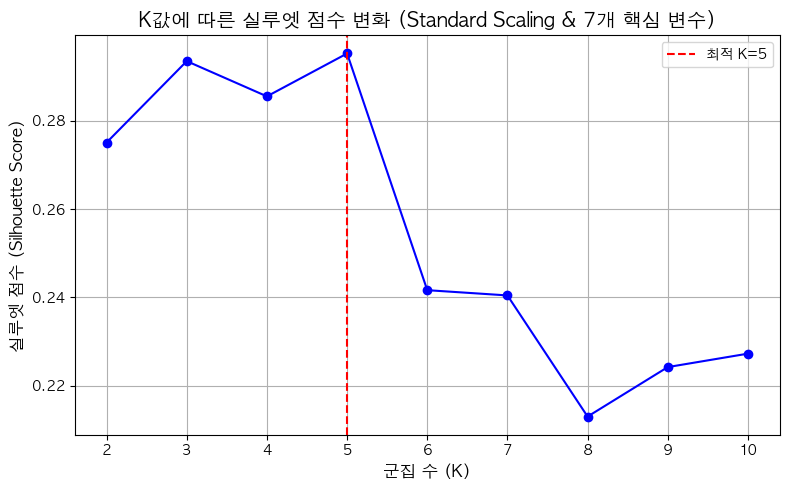

In [10]:
# 5. 시각화 1: K값에 따른 실루엣 점수 변화 그래프
plt.figure(figsize=(8, 5))
plt.plot(k_range, silhouette_scores, marker='o', linestyle='-', color='b')
plt.axvline(x=best_k, color='r', linestyle='--', label=f'최적 K={best_k}')
plt.title('K값에 따른 실루엣 점수 변화 (Standard Scaling & 7개 핵심 변수)', fontsize=14)
plt.xlabel('군집 수 (K)', fontsize=12)
plt.ylabel('실루엣 점수 (Silhouette Score)', fontsize=12)
plt.xticks(k_range)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [11]:
# 6. 최종 군집화 및 프로파일링 계산
kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10)
# 군집 라벨링은 스케일링된 데이터로 정교하게 진행!
cluster_labels = kmeans.fit_predict(df_train_scaled)

# 해석용 데이터(0~1)에 라벨을 붙여 히트맵의 직관성을 유지.
df_train_copy = df_train_original.copy()
df_train_copy['cluster'] = cluster_labels
profile_mean = df_train_copy.groupby('cluster').mean()

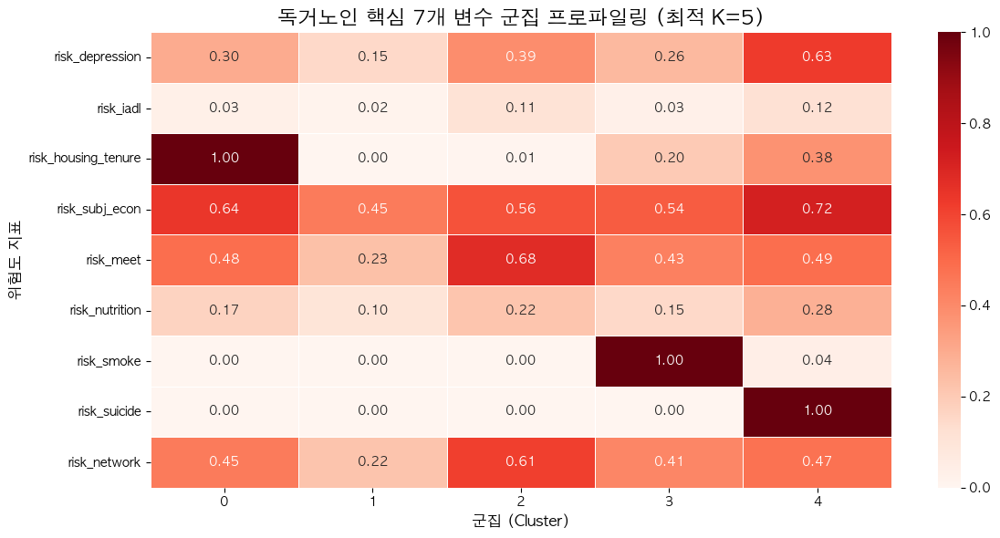

In [12]:
# 7. 시각화 2: 0~1 기반 히트맵 (빨간색일수록 위험)
plt.figure(figsize=(12, 6))
sns.heatmap(profile_mean.T, cmap='Reds', annot=True, fmt=".2f", linewidths=.5)
plt.title(f'독거노인 핵심 7개 변수 군집 프로파일링 (최적 K={best_k})', fontsize=16)
plt.xlabel('군집 (Cluster)', fontsize=12)
plt.ylabel('위험도 지표', fontsize=12)
plt.tight_layout()
plt.show()

In [13]:
# 8. 시각화 3 & 4: PCA 적용 후 2D / 3D 애니메이션 시각화
print("\n[시각화 준비] 2D/3D 산점도를 위해 PCA 차원 압축을 진행합니다...")

# 이미 df_train_scaled로 스케일링이 되어 있으므로 그대로 PCA에 도입.
pca = PCA(n_components=3, random_state=42)
pca_coords = pca.fit_transform(df_train_scaled)

viz_df = pd.DataFrame(pca_coords, columns=['PC1', 'PC2', 'PC3'])
viz_df['Cluster'] = cluster_labels.astype(str) # 범주형으로 색상을 나누기 위해 문자열 변환
viz_df = viz_df.sort_values('Cluster') # 범례 순서 정렬


[시각화 준비] 2D/3D 산점도를 위해 PCA 차원 압축을 진행합니다...


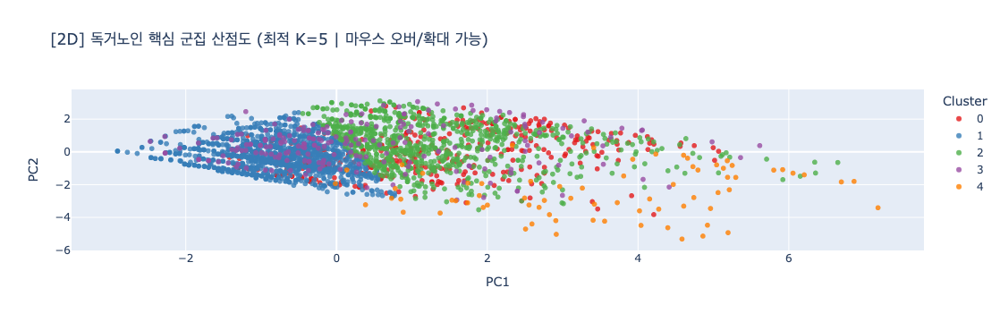

In [14]:
# [2D 시각화] 마우스 오버 시 정보 확인 및 줌 가능 (Plotly)
fig_2d = px.scatter(
    viz_df, x='PC1', y='PC2', color='Cluster',
    title=f'[2D] 독거노인 핵심 군집 산점도 (최적 K={best_k} | 마우스 오버/확대 가능)',
    color_discrete_sequence=px.colors.qualitative.Set1
)
fig_2d.update_traces(marker=dict(size=6, opacity=0.8))
fig_2d.show()

In [15]:
# [3D 시각화] Matplotlib & HTML5 Video
print("\n 3D 회전 애니메이션 영상을 렌더링 중입니다. (수 초 정도 소요될 수 있습니다...)")

fig_3d = plt.figure(figsize=(10, 8))
ax_3d = fig_3d.add_subplot(111, projection='3d')

# 색상 매핑 (군집 수에 맞게 Set1 컬러맵 사용)
cmap = plt.get_cmap('Set1')
colors = [cmap(i) for i in range(best_k)]
cluster_colors = [colors[int(label)] for label in cluster_labels]

# 3D 산점도 그리기
scatter = ax_3d.scatter(viz_df['PC1'], viz_df['PC2'], viz_df['PC3'], 
                        c=cluster_colors, alpha=0.7, s=15)

ax_3d.set_title(f'[3D 애니메이션] 독거노인 군집 산점도 자동 회전 (K={best_k})', fontsize=15, pad=20)
ax_3d.set_xlabel('PC1')
ax_3d.set_ylabel('PC2')
ax_3d.set_zlabel('PC3')

# 애니메이션 업데이트 함수
def update_camera(frame):
    ax_3d.view_init(elev=20, azim=frame)
    return fig_3d,

# 애니메이션 객체 생성 (360도 회전, 5도씩 이동)
anim = animation.FuncAnimation(
    fig_3d, update_camera, 
    frames=np.arange(0, 360, 5), 
    interval=100, 
    blit=False
)

# 정지된 빈 그래프가 중복 출력되는 것을 방지
plt.close(fig_3d)

# Jupyter Notebook 내에 HTML 비디오 플레이어 형태로 출력
display(HTML(anim.to_jshtml()))


 3D 회전 애니메이션 영상을 렌더링 중입니다. (수 초 정도 소요될 수 있습니다...)



[랜덤 포레스트] 각 군집별 주요 변수(Feature Importance) 분석

=== [Cluster 0] 의 핵심 결정 변수 ===
 - risk_housing_tenure: 0.7996
 - risk_smoke: 0.0763
 - risk_suicide: 0.0423
 - risk_subj_econ: 0.0316
 - risk_depression: 0.0176
 - risk_iadl: 0.0108
 - risk_network: 0.0085
 - risk_meet: 0.0074
 - risk_nutrition: 0.0058
----------------------------------------
=== [Cluster 1] 의 핵심 결정 변수 ===
 - risk_network: 0.2063
 - risk_meet: 0.1973
 - risk_housing_tenure: 0.1829
 - risk_depression: 0.1546
 - risk_smoke: 0.1055
 - risk_subj_econ: 0.0509
 - risk_nutrition: 0.0457
 - risk_iadl: 0.0418
 - risk_suicide: 0.0150
----------------------------------------
=== [Cluster 2] 의 핵심 결정 변수 ===
 - risk_meet: 0.2134
 - risk_network: 0.2108
 - risk_depression: 0.1679
 - risk_housing_tenure: 0.1572
 - risk_iadl: 0.0709
 - risk_nutrition: 0.0563
 - risk_smoke: 0.0537
 - risk_subj_econ: 0.0448
 - risk_suicide: 0.0251
----------------------------------------
=== [Cluster 3] 의 핵심 결정 변수 ===
 - risk_smoke: 0.9606
 - risk_depression

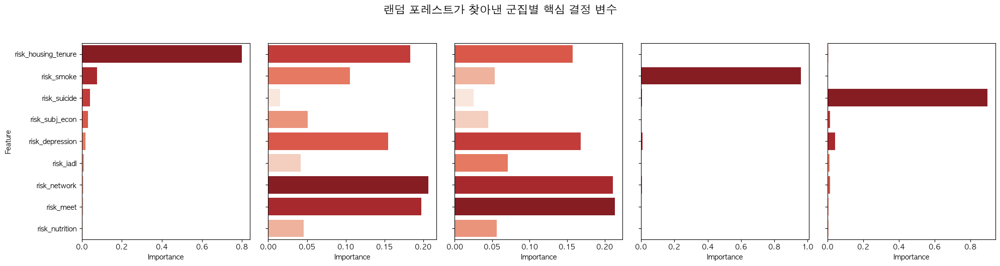

In [20]:
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
import seaborn as sns

print("\n[랜덤 포레스트] 각 군집별 주요 변수(Feature Importance) 분석\n")

# 트리 기반 모델(랜덤 포레스트)은 스케일링의 영향을 받지 않으므로,변수명이 그대로 살아있는 df_train_original을 사용
X = df_train_original

# 그래프를 그리기 위한 준비 (군집 수에 맞게 서브플롯 생성)
fig, axes = plt.subplots(1, best_k, figsize=(4 * best_k, 5), sharey=True)
if best_k == 1:
    axes = [axes] # 군집이 1개일 예외 상황 처리

for cluster_id in range(best_k):
    # 1. 타겟 변수 생성 (One-vs-Rest)
    # 현재 군집(cluster_id)에 속하면 1, 아니면 0으로 변환
    y_binary = (cluster_labels == cluster_id).astype(int)
    
    # 2. 랜덤 포레스트 모델 학습
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X, y_binary)
    
    # 3. 변수 중요도 추출 및 데이터프레임 정리
    importance_df = pd.DataFrame({
        'Feature': X.columns,
        'Importance': rf.feature_importances_
    }).sort_values(by='Importance', ascending=False)
    
    # 4. 콘솔에 텍스트로 출력 (영향력이 큰 순서대로 수치와 함께)
    print(f"=== [Cluster {cluster_id}] 의 핵심 결정 변수 ===")
    for index, row in importance_df.iterrows():
        print(f" - {row['Feature']}: {row['Importance']:.4f}")
    print("-" * 40)
    
    # 5. 서브플롯에 막대 그래프 시각화 (FutureWarning 해결 버전)
    sns.barplot(
        x='Importance', y='Feature', 
        data=importance_df, 
        ax=axes[cluster_id], 
        palette='Reds_r',
        hue='Feature',      
        legend=False       
    )

plt.suptitle('랜덤 포레스트가 찾아낸 군집별 핵심 결정 변수', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()